# **Introduction**

### **Research objectives**

The main objective of this research is to develop a 3 Machine Learning Models which are able to predict those with diabetes (gh >= 6.5%) with the best predictability rate. The end-user of this ML system will be the medical professionals and potentially the patients who would like to know whether they could be having diabetes. By accurately predicting diabetes, this predictive models will help to ensure prompt intervention on patients with diabetes, thus ensuring better life outcomes for the patients and avert uncecessary further financial burden due to delayed treatment.

### **Machine Learning Task and proposed models**

I will first need to create a target variable `has_diabetes` (tells us whether the patient is diabetic or not according to specified gh percentage), I will thus be adopting a supervised learning approach, since labels are already present, with a 70-30 train test split. To better explain the decision-making process behind each models (whether easily interpretable or not), I will also adopt the use of an Explainable-AI tool, which in my case is the SHAP, which stands for SHapley Additive exPlanations, which is to provide interpretable insights on how each of the feature impacts the model's decision making process. The benefit of such is that it can also educate the end-users on some of the key reasons and trends of identifying diabetes based on the unique attributes of patients. At the same time, it provides a human-over-the-loop monitoring for the team of data scientists/engineers to verify the decision-making process of the ML models, to ensure the ethics of AI and transparency of AI are upheld, especially important for the health sector. This is important to avert any biases in the model prediction.

### **Exploratory Data Analysis**

This flow aims to first deepen our understanding of the characteristics behind the dataset, which can facilitate proper data preparation processes such as feature removal, feature selection, feature engineering, and the conduct of statistical tests (hypothesis testing and correlation tests).

Along the way in this notebook, the main aim is to:

- Perform Data Quality Check: Examining the dataset for missing values, extreme/unusual values and class
- Provide Descriptive Statistics and Analysis: This is important to guide the modelling process and highlight/corroborate the importance of each ML models in the subsequent part

The EDA Process will therefore comprise the following steps below:

1. Data Collection and Understanding
2. Data Cleaning and Preprocessing
3. Descriptive Statistics
4. Univariate Analysis
5. Bivariate Analysis
6. Multivariate Analysis
7. Feature Engineering
8. Report EDA Findings and Visualisations

Generally, the aim at the end of EDA process is to uncover key insights that will guide the modeling process and highlight the importance of each of the three ML models

Along the way in this notebook, we will also uncover some additional insights which will also aid us in the understanding of our data and how we frame our ML solutions to fulfill our research objectives.


In [1]:
# Load relevant libraries

import pandas as pd
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime, date
from IPython.display import display

from sklearn import datasets, linear_model, preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

from ydata_profiling import ProfileReport
from scipy.stats import chi2_contingency
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder

import shap

#### **Data Collection and Understanding**


In [2]:
# Data Preparation

# Load the dataset
raw_df = pd.read_csv("nhgh.tsv", sep="\t")

# Display basic information about the dataset
display()
display(raw_df.info())
display(raw_df.head())
# Check for duplicated rows
display(f"There are {raw_df.duplicated().sum()} duplicated rows")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6795 entries, 0 to 6794
Data columns (total 20 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   seqn     6795 non-null   int64  
 1   sex      6795 non-null   object 
 2   age      6795 non-null   float64
 3   re       6795 non-null   object 
 4   income   6475 non-null   object 
 5   tx       6795 non-null   int64  
 6   dx       6795 non-null   int64  
 7   wt       6795 non-null   float64
 8   ht       6795 non-null   float64
 9   bmi      6795 non-null   float64
 10  leg      6564 non-null   float64
 11  arml     6616 non-null   float64
 12  armc     6607 non-null   float64
 13  waist    6556 non-null   float64
 14  tri      6314 non-null   float64
 15  sub      5824 non-null   float64
 16  gh       6795 non-null   float64
 17  albumin  6706 non-null   float64
 18  bun      6706 non-null   float64
 19  SCr      6706 non-null   float64
dtypes: float64(14), int64(3), object(3)
memory usage: 1.

None

,seqn,sex,age,re,income,tx,dx,wt,ht,bmi,leg,arml,armc,waist,tri,sub,gh,albumin,bun,SCr
0,51624,male,34.166667,Non-Hispanic White,"[25000,35000)",0,0,87.4,164.7,32.22,41.5,40.0,36.4,100.4,16.4,24.9,5.2,4.8,6.0,0.94
1,51626,male,16.833333,Non-Hispanic Black,"[45000,55000)",0,0,72.3,181.3,22.00,42.0,39.5,26.6,74.7,10.2,10.5,5.7,4.6,9.0,0.89
2,51628,female,60.166667,Non-Hispanic Black,"[10000,15000)",1,1,116.8,166.0,42.39,35.3,39.0,42.2,118.2,29.6,35.6,6.0,3.9,10.0,1.11
3,51629,male,26.083333,Mexican American,"[25000,35000)",0,0,97.6,173.0,32.61,41.7,38.7,37.0,103.7,19.0,23.2,5.1,4.2,8.0,0.80
4,51630,female,49.666667,Non-Hispanic White,"[35000,45000)",0,0,86.7,168.4,30.57,37.5,36.1,33.3,107.8,30.3,28.0,5.3,4.3,13.0,0.79


'There are 0 duplicated rows'

**At once glance, we know that `seqn` will not have much relationship or association with the outcome of diabetes, as its purely for identification, hence we will drop this column on the fly**


In [3]:
raw_df.drop("seqn", axis=1, inplace=True)

#### **Here I use the y-data profiling (pandas profiling) tool to create an automated eda summary reference table for my preliminary reference and understanding of the data**

The html file is available in the current directory titled `Understanding of RAW Data.html`


In [4]:
########################################################################################################
##--y-data profiling, previously known as pandas profiling, is performed to conduct an automated eda--##
########################################################################################################
profile = ProfileReport(raw_df, title="Understanding of RAW Data")
profile.to_notebook_iframe()
profile.to_file("Understanding of RAW Data.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

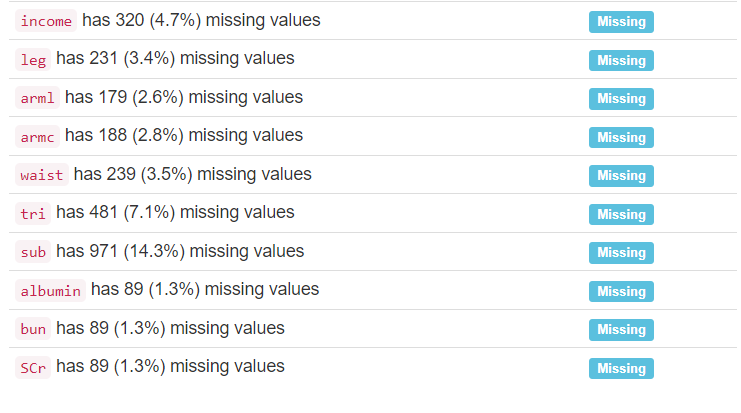
